In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from collections import defaultdict, Counter

In [2]:
data1 = pd.read_csv("issue_4\papers1.csv")
data1.head()

,Conference,Year,Title,Author,Affiliation
0,NeurIPS,2006,Attentional Processing on a Spike-Based VLSI N...,Yingxue Wang,"Swiss Federal Institute of Technology, Zurich"
1,NeurIPS,2006,Attentional Processing on a Spike-Based VLSI N...,Rodney J Douglas,Institute of Neuroinformatics
2,NeurIPS,2006,Attentional Processing on a Spike-Based VLSI N...,Shih-Chii Liu,"Institute for Neuroinformatics, University of ..."
3,NeurIPS,2006,Multi-Task Feature Learning,Andreas Argyriou,Ecole Centrale de Paris
4,NeurIPS,2006,Multi-Task Feature Learning,Theos Evgeniou,INSEAD


In [ ]:
# REDUNDANT

# get the list of the top 10 universities till now

# count the unique occuerences of the names of insitutes in the 'Affiliation' column
unique_occ = defaultdict(int)
unique_occ.update(Counter(data1['Affiliation']))

# the dictionary unique_occ now contains the names of institutes as key values and 
# the number of times they have repeated as the values in the dictionary

if 'None' in unique_occ:
    del unique_occ['None']

sorted_dict = sorted(unique_occ.items(), key=lambda item: item[1], reverse=True)  # sorts based on values in the dictionary
top10 = [item[0] for item in sorted_dict[:10]]  # collecting the top 10 institutes

# top10 is a list that contains the top 10 institutes i.e. the top 10 institutes with highest research papers published as per the data

In [ ]:
# REDUNDANT

top10_count = {}

for year in range(2006, 2022):
    temp = data1[data1.Year == year]
    # Obtaining the number of papers published by each insititute in this particular year
    counts = temp.groupby('Affiliation').size()
    counts = counts.sort_values(ascending=False)

    top_10 = list(counts.index)[:10]
    top10_count[year] = [counts[insti] if insti in counts else 0 for insti in top_10]

# top10_count is a dictionary which now has:
# key -> year
# value -> list of numbers of papers published by the top 10 institutes in repective year

In [3]:
def get_top10(data, year):
    # Get data for specific year
    temp = data[data.Year == year]
    
    # Count the unique occurrences of the names of institutes in the 'Affiliation' column
    unique_occ = defaultdict(int)
    unique_occ.update(Counter(temp['Affiliation']))

    # the dictionary unique_occ now contains the names of institutes as key values and 
    # the number of times they have repeated as the values in the dictionary
    
    # Remove the 'None' key if present
    if 'None' in unique_occ:
        del unique_occ['None']

    unique_occ['MIT'] = unique_occ.pop('Massachusetts Institute of Technology', None)
    unique_occ['CMU'] = unique_occ.pop('Carnegie Mellon University', None)
    if 'Google DeepMind' in unique_occ:
        unique_occ['DeepMind'] = unique_occ['Google DeepMind']
        del unique_occ['Google DeepMind']

    # print(unique_occ)
    # Sort the dictionary by the number of publications and get the top 10 institutes
    sorted_occ = sorted(unique_occ.items(), key=lambda x: x[1], reverse=True)[:10]
    sorted_occ = [x for x in sorted_occ if str(x[0]) != 'nan']
    
    # Create two lists: one containing the top 10 institute names, and the other containing their corresponding publication counts
    # print(sorted_occ)
    top10 = [x[0] for x in sorted_occ]
    top10_count = [x[1] for x in sorted_occ]
    
    return top10, top10_count

In [4]:
top10, top10_count = get_top10(data1, 2006)
print(top10)
print(top10_count)

['Google', 'Stanford University', 'CMU', 'UC Berkeley', 'University of California, Irvine', 'Microsoft Research', 'MPI for Intelligent Systems, Tübingen', 'Princeton', 'ETH Zurich', 'National ICT Australia']
[14, 13, 13, 11, 9, 9, 7, 7, 7, 6]


In [5]:
import plotly.graph_objects as go

# Define color palette
# colors = ["#1f77b4", "#ff7f0e", "#2ca02c", "#d62728", "#9467bd", "#8c564b", "#e377c2", "#7f7f7f", "#bcbd22", "#17becf"]

# Create figure
fig = go.Figure()

# Add traces for first year
year = 2006
top10, top10_count = get_top10(data1, year)
fig.add_trace(
    go.Bar(
        x=top10,
        y=top10_count,
        name="Year=" + str(year),
        text=top10_count,  # Add text labels
        textposition='auto',  # Set text position
        marker=dict(color=top10_count, colorscale='Viridis'),
        width=0.9 # Set bar width
    )
)

# Set up slider
slider_dict = {}
for i in range(16):
    year = 2006 + i
    # print(year)
    top10, top10_count = get_top10(data1, year)
    slider_dict[f'Year {year}'] = {
        'label': str(year),
        'method': 'update',
        'args': [
            {"x": [top10], "y": [top10_count], "name": ["Year=" + str(year)], "text": [top10_count]}
        ]
    }

steps = []
for key, value in slider_dict.items():
    step = dict(
        method=value['method'],
        args=value['args'],
        label=value['label']
    )
    steps.append(step)

sliders = [
    {
        "active": 0,
        "steps": steps,
        "currentvalue": {"prefix": "Year: ", "font": {"size": 13}},
        "len": 0.9,
        "x": 0.1,
        "y": 0,
        "pad": {"t": 30, "b": 10}
    }
]

# Update layout
fig.update_layout(
    sliders=sliders,
    xaxis_title="Institutes",
    yaxis_title="Number of Papers",
    title="Top 10 Institutes",  # Set initial title
    font=dict(size=13),
    width=1500,
    height=600,
    xaxis=dict(
        tickmode='linear',  # Set tick mode to linear
        dtick=1,  # Set tick distance to 1 unit
        tickangle=0,  # Set tick angle to 0 degrees
        tickfont=dict(size=10)  # Set tick font size
    )
)

# Show plot
fig.show()

The above plot displays the contribution of different institutions in publishing research papers in a particular year. The year can be changed using the slider. The top 10 institutes in the respective year are displayed aling with the number of papers they have published. The number of papers published have increased from around **10** papers only in **2006** to about **200** papers in **2020**. However, in the year 2021, the number of papers decreased considerably to approximately 100 due to the COVID crises. Certain institutions like **Google, Stanford University, MIT, CMU**, etc. are persistent in the top 10 thus, contirbuting significantly every year to the research in the field of AI. Also, **DeepMind** founded in 2010 (later acquired by Google in 2015 - named Google DeepMind then onwards) showed considerable progress through the years due to the deep learning boom in AI.  

In [6]:
import pandas as pd
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
import gensim
from wordcloud import WordCloud

def preprocess(text):
    # Tokenize the text into individual words
    tokens = simple_preprocess(text, deacc=True)
    # Remove stopwords
    stopped_tokens = [t for t in tokens if not t in STOPWORDS and t != 'learn' and t != 'learning' and t != 'models']
    return stopped_tokens

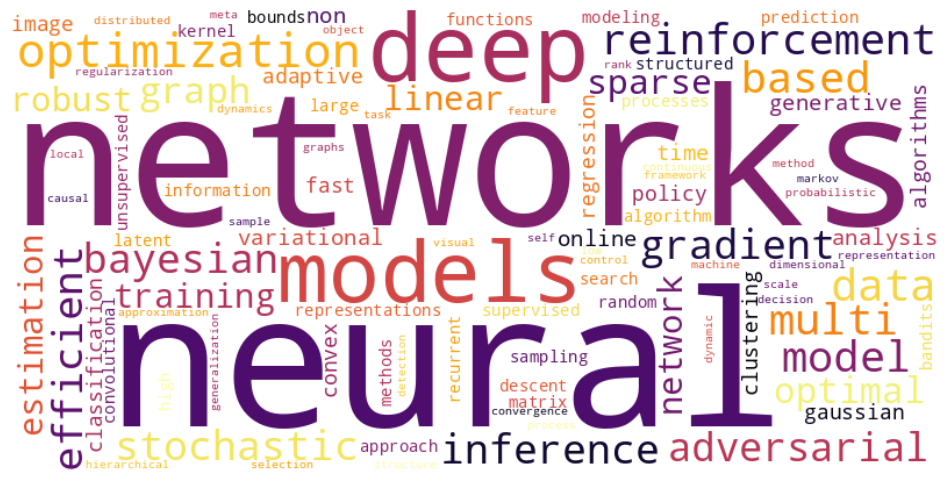

In [ ]:
# REDUNDANT

import pandas as pd
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
from wordcloud import WordCloud

# Preprocess the 'title' column
unique_titles = data1['Title'].unique()
preprocessed_titles = [preprocess(title) for title in unique_titles]

# Generate word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='inferno', max_words=100).generate_from_frequencies(dict(Counter([word for title in preprocessed_titles for word in title])))

# Display the word cloud
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [10]:
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import Counter
import imageio

preprocessed_titles = {}

for year in data1['Year'].unique():
    titles = data1[data1['Year'] == year]['Title']
    preprocessed_titles[year] = [preprocess(title) for title in titles]

# Generate word clouds for each year and save them as separate images
wordclouds = []

for year in preprocessed_titles.keys():
    wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis', max_words=100).generate_from_frequencies(dict(Counter([word for title in preprocessed_titles[year] for word in title])))
    plt.figure(figsize=(12, 8))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"Year : {year}")
    plt.savefig(f"wordcloud_{year}.png")
    wordclouds.append((year, wordcloud))
    plt.close()

# Create the gif animation using imageio
images = [imageio.imread(f"wordcloud_{year}.png") for year in data1['Year'].unique()]
imageio.mimsave('wordcloud_animation.gif', images, fps=2)


<ipython-input-10-e463a88b60f0>:28: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



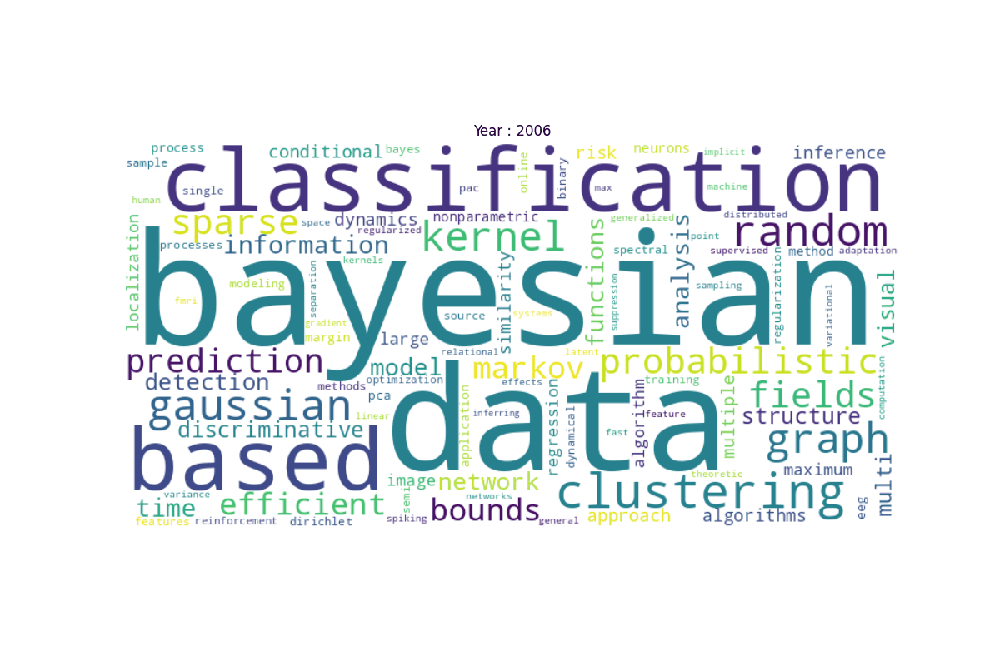

In [11]:
import matplotlib.image as mpimg
from IPython.display import Image

Image(open('/content/wordcloud_animation.gif','rb').read())

The gif above is the animation of wordclouds of titles of papers published per year. As seen in the wordclouds, the common words in the title before 2012 mostly have bayesian, naive, etc as the most prominent words. However, after 2012 due to the shift of the world towards neural networks and deep learning, the word clouds after 2012 display the words neural, networks, deep, etc as the most significant words.

In [34]:
import pandas as pd
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
import gensim
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import Counter
import imageio

# Define the universities to generate word clouds for
universities = ['MIT', 'UC Berkeley', 'DeepMind', 'Stanford', 'CMU']

# Loop through each university
for university in universities:

    # Filter the data to only include papers from the current university
    uni_data = data1[data1['Affiliation'] == university]

    # Preprocess the paper titles
    preprocessed_titles = {}
    for year in uni_data['Year'].unique():
        titles = uni_data[uni_data['Year'] == year]['Title']
        preprocessed_titles[year] = [preprocess(title) for title in titles]

    # Generate word clouds for each year and save them as separate images
    wordclouds = []
    for year in preprocessed_titles.keys():
        wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis', max_words=100).generate_from_frequencies(dict(Counter([word for title in preprocessed_titles[year] for word in title])))
        plt.figure(figsize=(12, 8))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title(f"{university} - Year : {year}")
        plt.savefig(f"{university}_wordcloud_{year}.png")
        wordclouds.append((year, wordcloud))
        plt.close()

    # Create the gif animation using imageio
    images = [imageio.imread(f"{university}_wordcloud_{year}.png") for year in uni_data['Year'].unique()]
    imageio.mimsave(f'{university}_wordcloud_animation.gif', images, fps=2)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

/usr/local/lib/python3.10/dist-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

/usr/local/lib/python3.10/dist-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

/usr/local/lib/python3.10/dist-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning:


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

<ipython-input-36-57581ce9c9dc>:4: ResourceWarning:

unclosed file <_io.BufferedReader name='/content/MIT_wordcloud_animation.gif'>



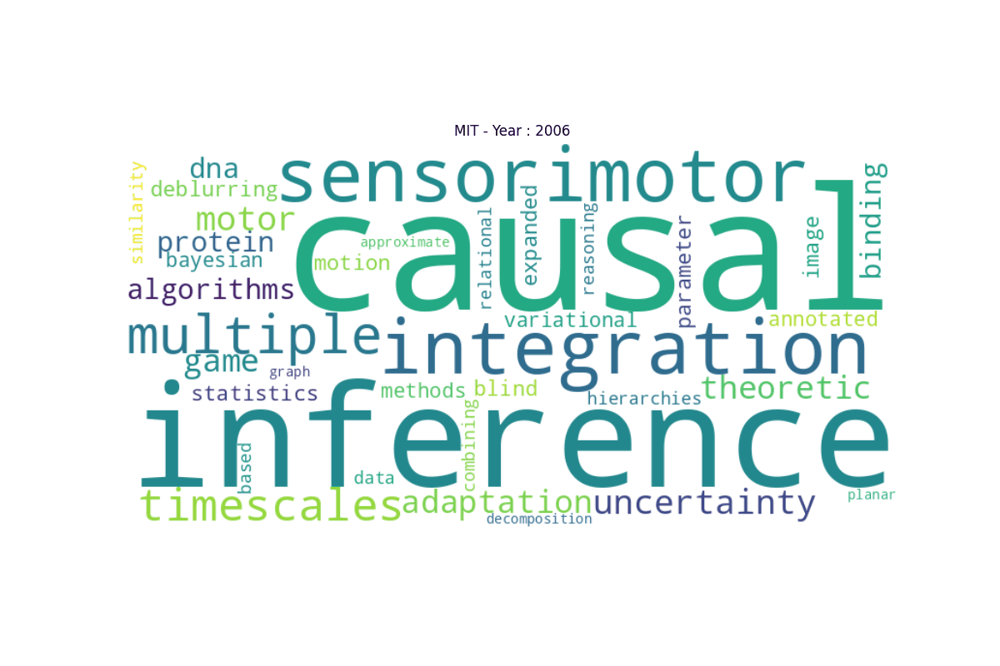

In [36]:
import matplotlib.image as mpimg
from IPython.display import Image

Image(open('/content/MIT_wordcloud_animation.gif','rb').read())

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

<ipython-input-37-025190bfceaa>:1: ResourceWarning:

unclosed file <_io.BufferedReader name='/content/UC Berkeley_wordcloud_animation.gif'>



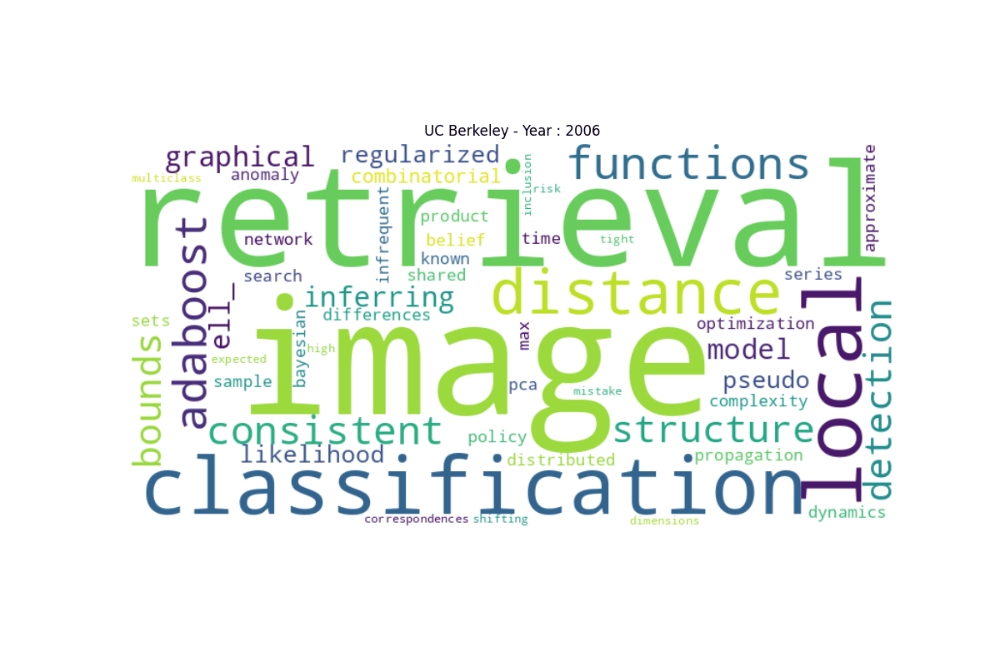

In [37]:
Image(open('/content/UC Berkeley_wordcloud_animation.gif','rb').read())

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

<ipython-input-38-7d12db545bb6>:1: ResourceWarning:

unclosed file <_io.BufferedReader name='/content/Stanford_wordcloud_animation.gif'>



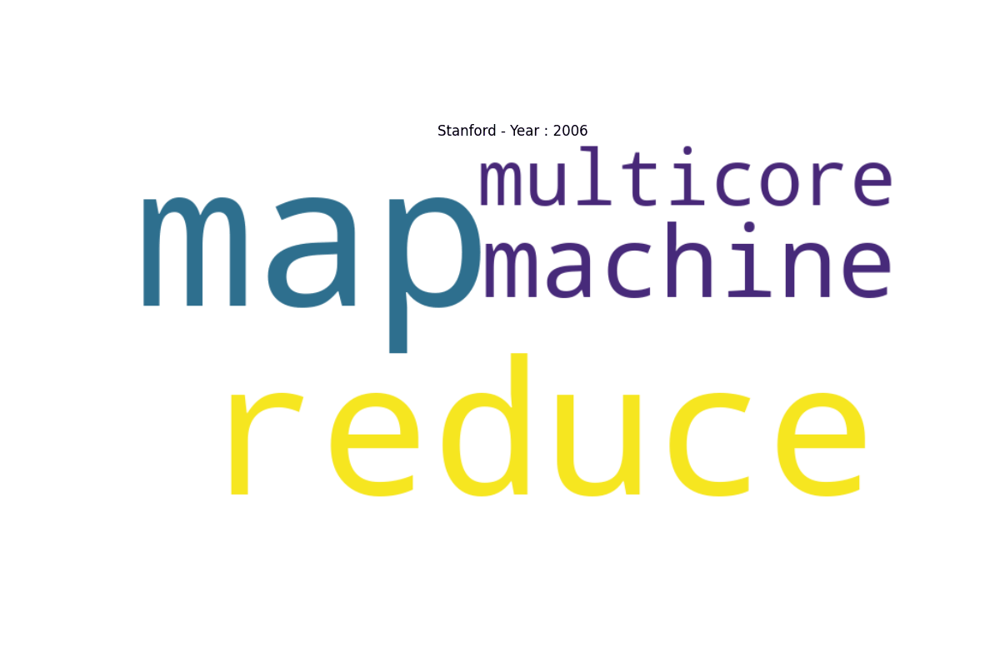

In [38]:
Image(open('/content/Stanford_wordcloud_animation.gif','rb').read())

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

<ipython-input-39-2043698fe7c0>:1: ResourceWarning:

unclosed file <_io.BufferedReader name='/content/DeepMind_wordcloud_animation.gif'>



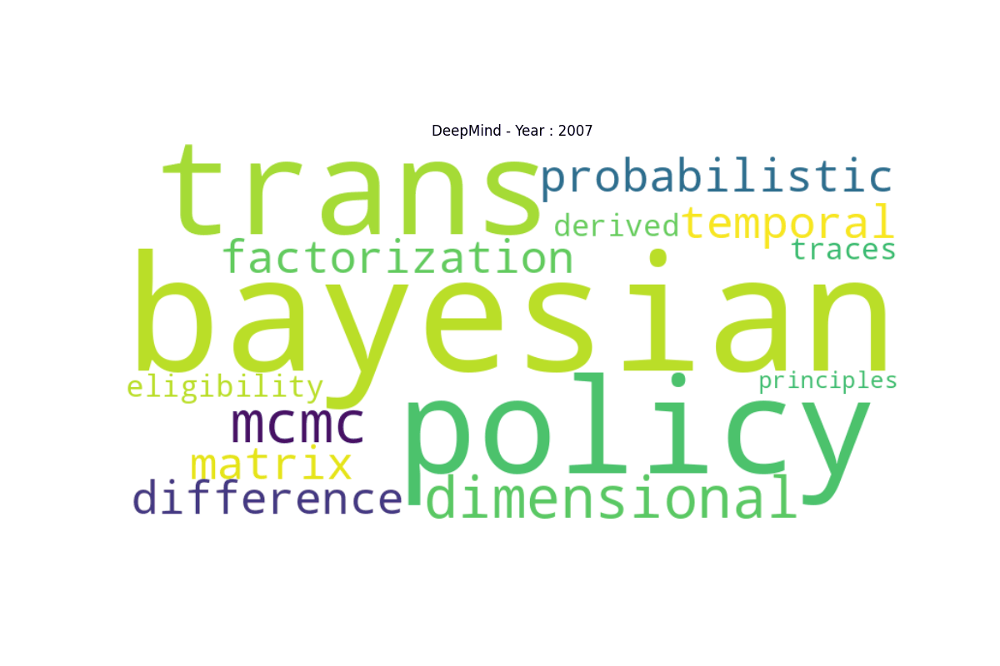

In [39]:
Image(open('/content/DeepMind_wordcloud_animation.gif','rb').read())

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

<ipython-input-40-c0404f57aefd>:1: ResourceWarning:

unclosed file <_io.BufferedReader name='/content/CMU_wordcloud_animation.gif'>



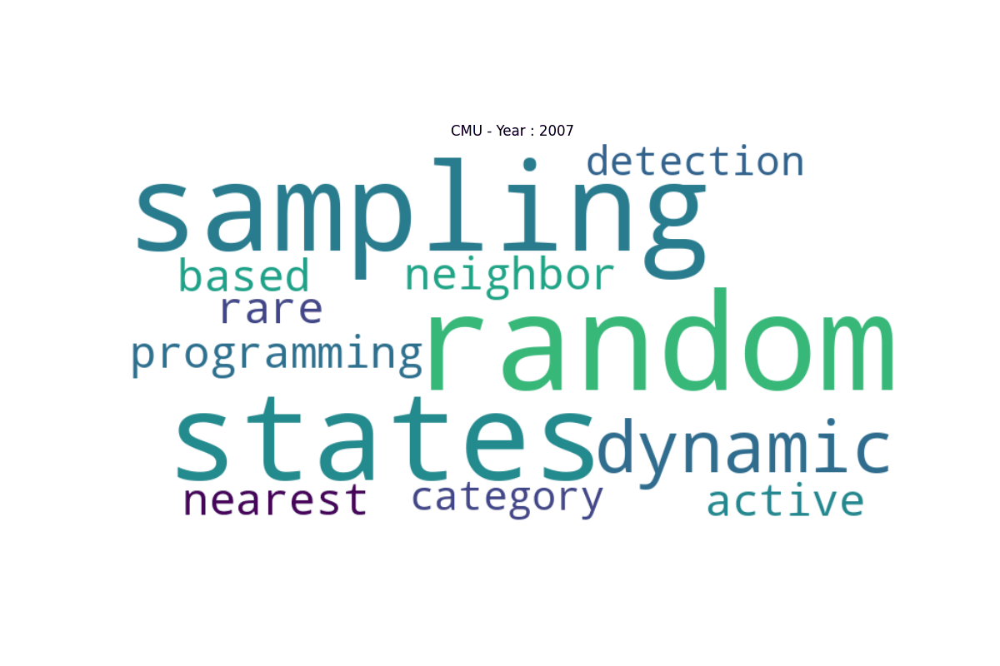

In [40]:
Image(open('/content/CMU_wordcloud_animation.gif','rb').read())

Plotted above are word clouds of titles of papers published through the years 5 top institutes: Stanford University, Google Deepmind, MIT, CMU, UC Berkeley. There is a shift from Bayesian models to neural networks, deep learning, reinforecement learning and transfer learning in all institutes as it appears from the word clouds. 

In [51]:
from IPython.display import HTML

# Define the paths to the gif files
mit_gif = "/content/MIT_wordcloud_animation.gif"
ucb_gif = "/content/UCB_wordcloud_animation.gif"
deepmind_gif = "/content/DeepMind_wordcloud_animation.gif"
stanford_gif = "/content/Stanford_wordcloud_animation.gif"
cmu_gif = "/content/CMU_wordcloud_animation.gif"

# Generate the HTML code for displaying the gifs side by side
html = f'<div style="display:flex;"> \
            <img src="{mit_gif}" width="300" height="300"> \
            <img src="{ucb_gif}" width="300" height="300"> \
            <img src="{deepmind_gif}" width="300" height="300"> \
            <img src="{stanford_gif}" width="300" height="300"> \
            <img src="{cmu_gif}" width="300" height="300"> \
        </div>'

# Display the HTML code
HTML(html)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

